In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from tqdm import tqdm
import pandas as pd
from skimage import img_as_float
from skimage.segmentation import random_walker
from skimage.feature import greycomatrix, greycoprops
from skimage import io, color, img_as_ubyte
%matplotlib inline

# We will perform a set of operations on the images, below are those operations performed only on 1 image

In [2]:
img = cv2.imread("chest_xray/chest_xray/train/NORMAL/IM-0115-0001.jpeg",cv2.IMREAD_GRAYSCALE)

(<matplotlib.axes._subplots.AxesSubplot at 0x187456767f0>,
 <matplotlib.image.AxesImage at 0x187456f4be0>)

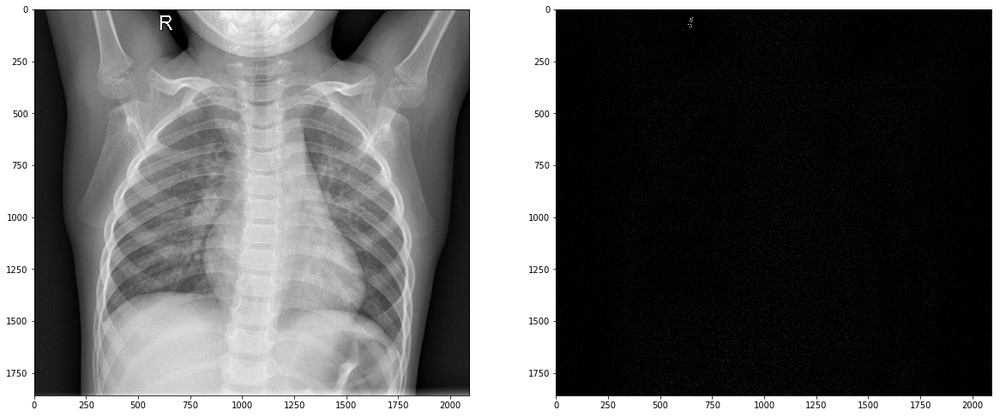

In [3]:
lap = cv2.Laplacian(img,cv2.CV_8UC1,3)
plt.figure(figsize=(20,10))
plt.subplot(121),plt.imshow(img,cmap='gray')
plt.subplot(122),plt.imshow(lap,cmap='gray')

(<matplotlib.axes._subplots.AxesSubplot at 0x187457799e8>,
 <matplotlib.image.AxesImage at 0x18745a44ef0>)

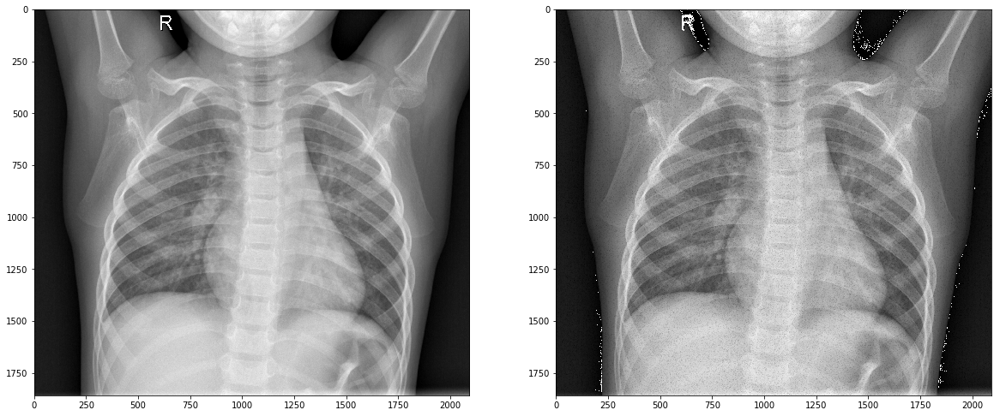

In [4]:
sharplap = img-lap
plt.figure(figsize=(20,10))
plt.subplot(121),plt.imshow(img,cmap='gray')
plt.subplot(122),plt.imshow(sharplap,cmap='gray')

(<matplotlib.axes._subplots.AxesSubplot at 0x18747928a20>,
 <matplotlib.image.AxesImage at 0x18747ca9be0>)

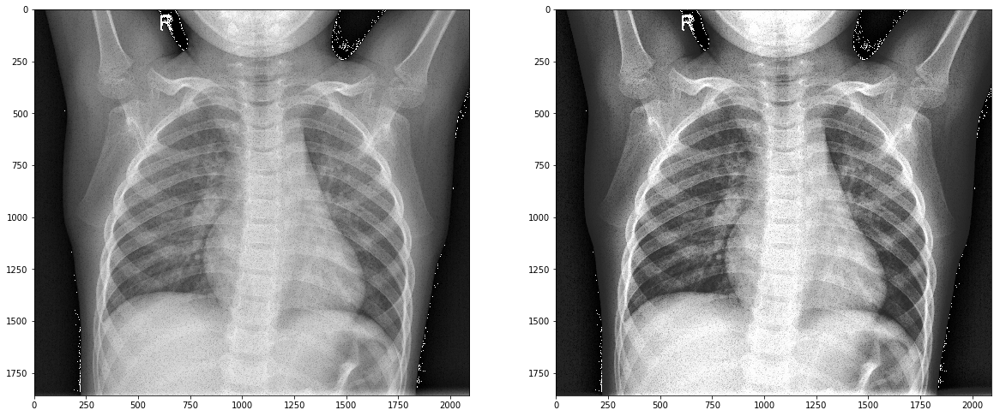

In [5]:
eq = cv2.equalizeHist(sharplap)
plt.figure(figsize=(20,10))
plt.subplot(121),plt.imshow(sharplap,cmap='gray')
plt.subplot(122),plt.imshow(eq,cmap='gray')

(<matplotlib.axes._subplots.AxesSubplot at 0x18748873ba8>,
 <matplotlib.image.AxesImage at 0x18748835eb8>)

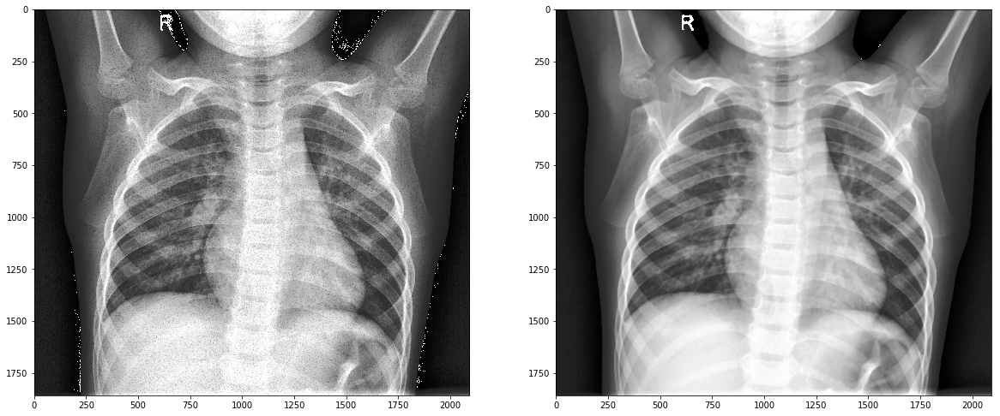

In [6]:
smooth = cv2.medianBlur(eq,9)
plt.figure(figsize=(20,10))
plt.subplot(121),plt.imshow(eq,cmap = "gray")
plt.subplot(122),plt.imshow(smooth,cmap = "gray")

(<matplotlib.axes._subplots.AxesSubplot at 0x187496eae80>,
 <matplotlib.image.AxesImage at 0x18749687978>)

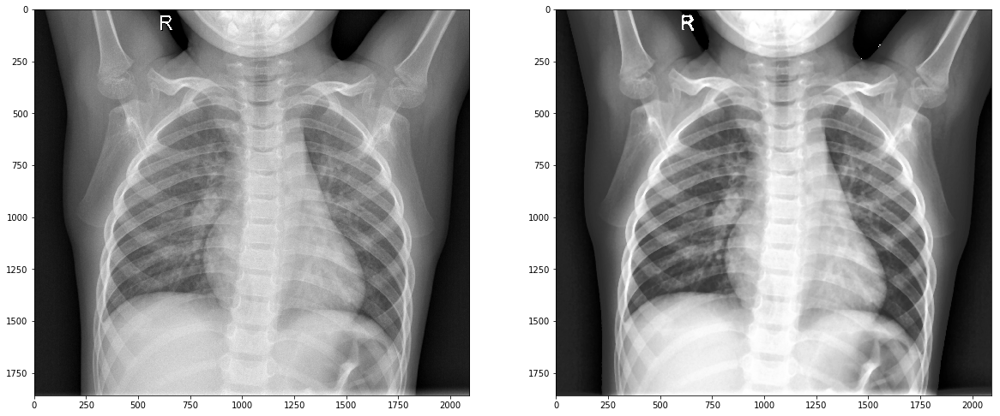

In [7]:
rows,cols = eq.shape
plaw = np.zeros((rows,cols))
for i in range(rows):
    for j in range(cols):
        plaw[i,j] = 1.7*np.power(smooth[i,j],0.95)
plt.figure(figsize=(20,10))
plt.subplot(121),plt.imshow(img,cmap = "gray")
plt.subplot(122),plt.imshow(plaw,cmap = "gray")

In [8]:
newimg1 = cv2.imread("chest_xray/chest_xray/final_train/NORMAL/IM-0115-0001.png",cv2.IMREAD_GRAYSCALE)

In [9]:
import math
def psnr(img1, img2):
    mse = np.mean( (img1 - img2) ** 2 )
    if mse == 0:
        return 100
    PIXEL_MAX = 255.0
    return 20 * math.log10(PIXEL_MAX / math.sqrt(mse))

d=psnr(plaw,newimg1)
print(round(d,2))

21.51


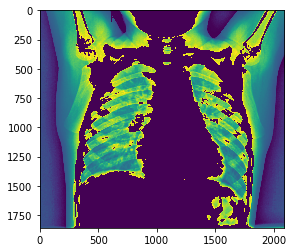

In [9]:
markers = np.zeros(newimg1.shape,dtype=np.uint)
markers[(newimg1 < 200)] = newimg1[(newimg1 < 200)]
markers[(newimg1 > 200)] = 0
plt.imshow(markers)

(<matplotlib.axes._subplots.AxesSubplot at 0x2259847c208>,
 <matplotlib.image.AxesImage at 0x22599d5b4e0>)

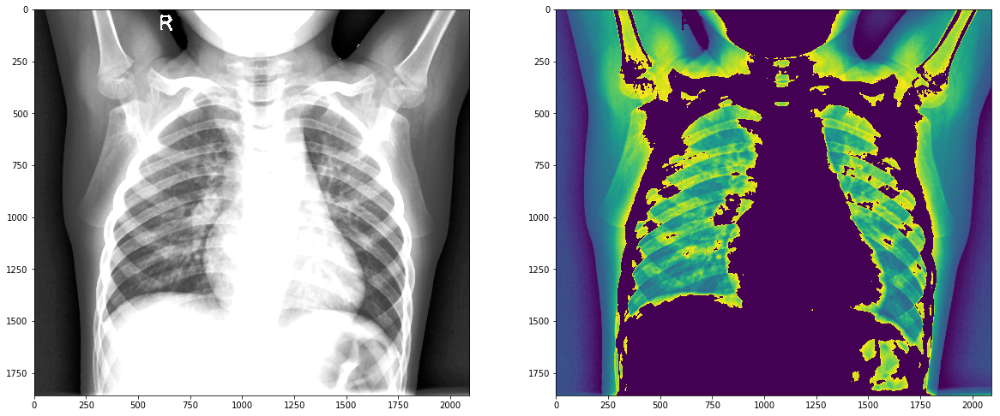

In [15]:
plt.figure(figsize=(20,10))
plt.subplot(121),plt.imshow(newimg1,cmap = "gray")
plt.subplot(122),plt.imshow(markers)

Now we will compile these operation in one single function and then apply that function on complete dataset

# Image Processing

In [30]:
def image_processing(folder1,folder2):
    for fname in tqdm(os.listdir(folder1)):
        img = cv2.imread(os.path.join(folder1,fname),cv2.IMREAD_GRAYSCALE)
        if img is not None:
            lap = cv2.Laplacian(img,cv2.CV_8UC1,3)
            sharplap = (img - lap)
            eq = cv2.equalizeHist(sharplap)
            smooth = cv2.medianBlur(eq,9)
            rows,cols = smooth.shape
            powerlaw = np.zeros((rows,cols))
            for i in range(rows):
                for j in range(cols):
                    powerlaw[i,j] = 1.7*np.power(smooth[i,j],0.95)
            name = fname.split(".")[0] + ".png"
            cv2.imwrite(os.path.join(folder2,name),powerlaw)

In [2]:
train_input_normal = "chest_xray/chest_xray/train/NORMAL/"
train_input_pneumonia = "chest_xray/chest_xray/train/PNEUMONIA/"
test_input_normal = "chest_xray/chest_xray/test/NORMAL/"
test_input_pneumonia = "chest_xray/chest_xray/test/PNEUMONIA/"

In [3]:
pro_tr_normal = "chest_xray/chest_xray/final_train/NORMAL"
pro_tr_pneumonia = "chest_xray/chest_xray/final_train/PNEUMONIA"
pro_te_normal = "chest_xray/chest_xray/final_test/NORMAL"
pro_te_pneumonia = "chest_xray/chest_xray/final_test/PNEUMONIA"

The Following 4 operations are to be performed only once....

In [6]:
#already performed
image_processing(train_input_normal,pro_tr_normal)

100%|██████████| 3876/3876 [04:53<00:00,  6.67it/s]


In [8]:
#already performed
image_processing(train_input_pneumonia,pro_tr_pneumonia)

100%|██████████| 390/390 [00:25<00:00, 16.48it/s]


In [5]:
#already performed
image_processing(test_input_normal,pro_te_normal)

100%|██████████| 1342/1342 [02:34<00:00,  8.71it/s]


In [7]:
#already performed
image_processing(test_input_pneumonia,pro_te_pneumonia)

100%|██████████| 234/234 [00:35<00:00,  6.68it/s]


# Segmentation and Feature Extraction

In [4]:
def seg_glcm(folder,target,df):
    for fname in tqdm(os.listdir(folder)):
        img = cv2.imread(os.path.join(folder,fname),cv2.IMREAD_GRAYSCALE)
        if img is not None:
            #Segmentation
            markers = np.zeros(img.shape,dtype=np.uint)
            markers[(img < 200)] = img[(img < 200)]
            markers[(img > 200)] = 1
            #Segmentation Over
            bins = np.array([0, 16, 32, 48, 64, 80, 96, 112, 128, 144, 160, 176, 192, 208, 224, 240, 255]) #16-bit
            inds = np.digitize(markers, bins)
            max_value = inds.max()+1
            matrix_coocurrence = greycomatrix(inds, [1],[0],levels=max_value, normed=False, symmetric=False)
            contrast = greycoprops(matrix_coocurrence, 'contrast')
            energy = greycoprops(matrix_coocurrence, 'energy')
            dissimilarity = greycoprops(matrix_coocurrence, 'dissimilarity')
            homogeneity = greycoprops(matrix_coocurrence, 'homogeneity')
            df = df.append({"Energy":round(energy[0,0],2),"Contrast":round(contrast[0,0],2),"Dissimilarity":round(dissimilarity[0,0],2),"Homogeneity":round(homogeneity[0,0],2),"Class":target},ignore_index=True)
    return(df)

In [8]:
test_normal = pd.DataFrame()
test_normal = seg_glcm(pro_te_normal,0,test_normal)

100%|██████████| 234/234 [00:37<00:00,  4.71it/s]


In [9]:
test_normal.to_csv("test_normal_glcm.csv",index=None)

In [11]:
test_pneumonia = pd.DataFrame()
test_pneumonia = seg_glcm(pro_te_pneumonia,1,test_pneumonia)

100%|██████████| 390/390 [00:28<00:00, 13.46it/s]


In [12]:
test_pneumonia.to_csv("test_pneumonia_glcm.csv",index=None)

In [13]:
test = test_normal.append(test_pneumonia);

In [14]:
test.to_csv("test_glcm.csv",index=None)

In [15]:
train_normal = pd.DataFrame()
train_normal = seg_glcm(pro_tr_normal,0,train_normal)

100%|██████████| 1341/1341 [03:28<00:00,  6.43it/s]


In [16]:
train_normal.to_csv("train_normal_glcm.csv",index=None)

In [17]:
train_pneumonia = pd.DataFrame()
train_pneumonia = seg_glcm(pro_tr_pneumonia,1,train_pneumonia)

100%|██████████| 3875/3875 [05:28<00:00, 14.63it/s]


In [18]:
train_pneumonia.to_csv("train_pneumonia_glcm.csv",index=None)

In [19]:
train = train_normal.append(train_pneumonia)

In [20]:
train.to_csv("train_glcm.csv",index=None)

# Classification

Note that in binary classification, recall of the positive class is also known as “sensitivity”; recall of the negative class is “specificity”.

In [2]:
from sklearn.svm import SVC

In [3]:
import scikitplot as skplt

In [6]:
train_glcm = pd.read_csv("train_glcm.csv")
test_glcm = pd.read_csv("test_glcm.csv")

In [7]:
X_train = train_glcm.drop(["Class"],axis=1)
y_train = train_glcm["Class"]
X_test = test_glcm.drop(["Class"],axis=1)
y_test = test_glcm["Class"]

In [45]:
svm = SVC(kernel="poly",probability=True)

In [46]:
svm.fit(X_train,y_train)

C:\Users\Tanay Shah\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='poly', max_iter=-1, probability=True, random_state=None,
  shrinking=True, tol=0.001, verbose=False)

In [47]:
pred_poly= svm.predict(X_test)
pred_prob_svm = svm.predict_proba(X_test)

In [2]:
from sklearn.metrics import accuracy_score,confusion_matrix

In [48]:
print("Confusion Matrix: ")
print(confusion_matrix(y_test,pred_poly))
print("Accuracy: "+str(accuracy_score(y_test,pred_poly)))
conf = confusion_matrix(y_test,pred_poly)
print("Sensitivity: "+str(conf[0,0]/(conf[0,0]+conf[0,1])))
print("Specificity: "+str(conf[1,1]/(conf[1,1]+conf[1,0])))

Confusion Matrix: 
[[219  15]
 [ 88 302]]
Accuracy: 0.8349358974358975
Sensitivity: 0.9358974358974359
Specificity: 0.7743589743589744


C:\Users\Tanay Shah\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function plot_roc_curve is deprecated; This will be removed in v0.5.0. Please use scikitplot.metrics.plot_roc instead.
  warnings.warn(msg, category=DeprecationWarning)


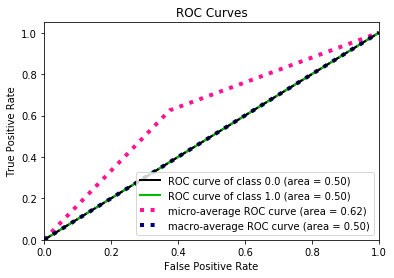

In [49]:
skplt.metrics.plot_roc_curve(y_test,pred_prob_svm)
plt.show()

In [15]:
from sklearn.metrics import roc_auc_score,roc_curve,auc

In [24]:
from sklearn.externals import joblib

In [26]:
joblib.dump(svm,"svm_poly.sav")

['svm_poly.sav']

In [3]:
from xgboost import XGBClassifier

In [4]:
xgb = XGBClassifier()

In [8]:
xgb.fit(X_train,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.1,
       max_delta_step=0, max_depth=3, min_child_weight=1, missing=None,
       n_estimators=100, n_jobs=1, nthread=None,
       objective='binary:logistic', random_state=0, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=None, silent=None,
       subsample=1, verbosity=1)

In [9]:
pred_xgb = xgb.predict(X_test)
pred_prob_xgb = xgb.predict_proba(X_test)

In [12]:
print("Confusion Matrix: ")
print(confusion_matrix(y_test,pred_xgb))
print("Accuracy: "+str(accuracy_score(y_test,pred_xgb)))
conf = confusion_matrix(y_test,pred_xgb)
print("Sensitivity: "+str(conf[0,0]/(conf[0,0]+conf[0,1])))
print("Specificity: "+str(conf[1,1]/(conf[1,1]+conf[1,0])))

Confusion Matrix: 
[[147  87]
 [ 15 375]]
Accuracy: 0.8365384615384616
Sensitivity: 0.6282051282051282
Specificity: 0.9615384615384616


C:\Users\Tanay Shah\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function plot_roc_curve is deprecated; This will be removed in v0.5.0. Please use scikitplot.metrics.plot_roc instead.
  warnings.warn(msg, category=DeprecationWarning)


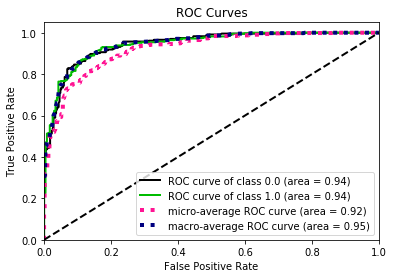

In [17]:
skplt.metrics.plot_roc_curve(y_test,pred_prob_xgb)
plt.show()

C:\Users\Tanay Shah\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function plot_precision_recall_curve is deprecated; This will be removed in v0.5.0. Please use scikitplot.metrics.plot_precision_recall instead.
  warnings.warn(msg, category=DeprecationWarning)


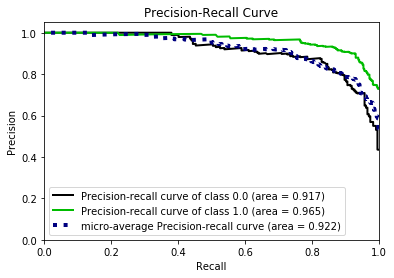

In [50]:
skplt.metrics.plot_precision_recall_curve(y_test,pred_prob_xgb)
plt.show()

In [18]:
from lightgbm import LGBMClassifier

In [19]:
lgbm = LGBMClassifier()

In [20]:
lgbm.fit(X_train,y_train)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
        importance_type='split', learning_rate=0.1, max_depth=-1,
        min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
        n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
        random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
        subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

In [21]:
pred_lgbm = lgbm.predict(X_test)
pred_prob_lgbm = lgbm.predict_proba(X_test)

In [22]:
print("Confusion Matrix: ")
print(confusion_matrix(y_test,pred_lgbm))
print("Accuracy: "+str(accuracy_score(y_test,pred_lgbm)))
conf = confusion_matrix(y_test,pred_lgbm)
print("Sensitivity: "+str(conf[0,0]/(conf[0,0]+conf[0,1])))
print("Specificity: "+str(conf[1,1]/(conf[1,1]+conf[1,0])))

Confusion Matrix: 
[[145  89]
 [ 12 378]]
Accuracy: 0.8381410256410257
Sensitivity: 0.6196581196581197
Specificity: 0.9692307692307692


C:\Users\Tanay Shah\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function plot_roc_curve is deprecated; This will be removed in v0.5.0. Please use scikitplot.metrics.plot_roc instead.
  warnings.warn(msg, category=DeprecationWarning)


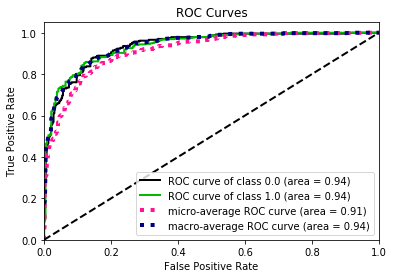

In [23]:
skplt.metrics.plot_roc_curve(y_test,pred_prob_lgbm)
plt.show()

C:\Users\Tanay Shah\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function plot_precision_recall_curve is deprecated; This will be removed in v0.5.0. Please use scikitplot.metrics.plot_precision_recall instead.
  warnings.warn(msg, category=DeprecationWarning)


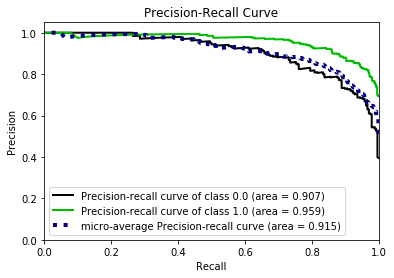

In [51]:
skplt.metrics.plot_precision_recall_curve(y_test,pred_prob_lgbm)
plt.show()

In [24]:
from sklearn.tree import DecisionTreeClassifier

In [31]:
dtree = DecisionTreeClassifier()

In [33]:
dtree.fit(X_train,y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [34]:
pred_tree = dtree.predict(X_test)
pred_prob_tree = dtree.predict_proba(X_test)

In [35]:
print("Confusion Matrix: ")
print(confusion_matrix(y_test,pred_tree))
print("Accuracy: "+str(accuracy_score(y_test,pred_tree)))
conf = confusion_matrix(y_test,pred_tree)
print("Sensitivity: "+str(conf[0,0]/(conf[0,0]+conf[1,0])))
print("Specificity: "+str(conf[1,1]/(conf[0,1]+conf[1,1])))

Confusion Matrix: 
[[130 104]
 [ 24 366]]
Accuracy: 0.7948717948717948
Sensitivity: 0.8441558441558441
Specificity: 0.7787234042553192


C:\Users\Tanay Shah\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function plot_roc_curve is deprecated; This will be removed in v0.5.0. Please use scikitplot.metrics.plot_roc instead.
  warnings.warn(msg, category=DeprecationWarning)


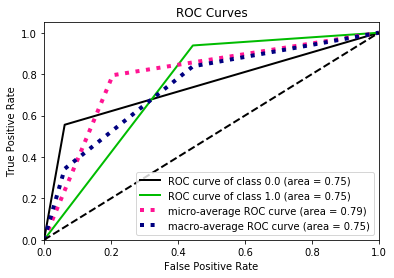

In [36]:
skplt.metrics.plot_roc_curve(y_test,pred_prob_tree)
plt.show()

In [37]:
from sklearn.ensemble import RandomForestClassifier

In [38]:
rfc = RandomForestClassifier()

In [39]:
rfc.fit(X_train,y_train)

C:\Users\Tanay Shah\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [40]:
pred_rfc = rfc.predict(X_test)
pred_prob_rfc = rfc.predict_proba(X_test)

In [41]:
print("Confusion Matrix: ")
print(confusion_matrix(y_test,pred_rfc))
print("Accuracy: "+str(accuracy_score(y_test,pred_rfc)))
conf = confusion_matrix(y_test,pred_rfc)
print("Sensitivity: "+str(conf[0,0]/(conf[0,0]+conf[1,0])))
print("Specificity: "+str(conf[1,1]/(conf[0,1]+conf[1,1])))

Confusion Matrix: 
[[149  85]
 [ 18 372]]
Accuracy: 0.8349358974358975
Sensitivity: 0.8922155688622755
Specificity: 0.8140043763676149


C:\Users\Tanay Shah\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function plot_roc_curve is deprecated; This will be removed in v0.5.0. Please use scikitplot.metrics.plot_roc instead.
  warnings.warn(msg, category=DeprecationWarning)


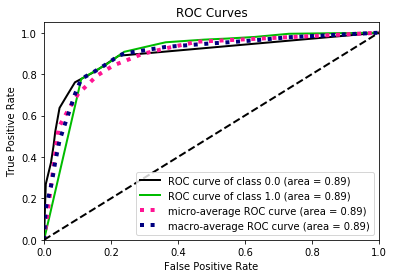

In [42]:
skplt.metrics.plot_roc_curve(y_test,pred_prob_rfc)
plt.show()

Area under curve: 0.795


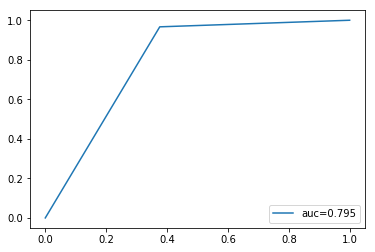

In [68]:
print("Area under curve: "+str(round(auc_rfc,3)))
plt.plot(fpr_rfc,tpr_rfc,label="auc="+str(round(auc_rfc,3)))
plt.legend(loc=4)
plt.show()

# Experimentation of Noisy Images (Gaussian Noise)

In [35]:
val_normal = "chest_xray/chest_xray/val/NORMAL/"
val_pneumonia = "chest_xray/chest_xray/val/PNEUMONIA/"
pro_val_normal = "chest_xray/chest_xray/final_val/NORMAL/"
pro_val_pneumonia = "chest_xray/chest_xray/final_val/PNEUMONIA/"
pro_un_val_normal = "chest_xray/chest_xray/final_un_val/NORMAL/"
pro_un_val_pneumonia = "chest_xray/chest_xray/final_un_val/PNEUMONIA/"

In [90]:
from skimage.util import random_noise

In [91]:
img = cv2.imread("chest_xray/chest_xray/val/NORMAL/NORMAL2-IM-1427-0001.jpeg",cv2.IMREAD_GRAYSCALE)

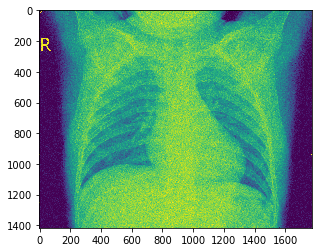

In [99]:
noise_img = random_noise(img, mode='gaussian', var=0.05**2)
noise_img = (255*noise_img).astype(np.uint8)
plt.imshow(noise_img)

(<matplotlib.axes._subplots.AxesSubplot at 0x23dd2d72ef0>,
 <matplotlib.image.AxesImage at 0x23dd2c41320>)

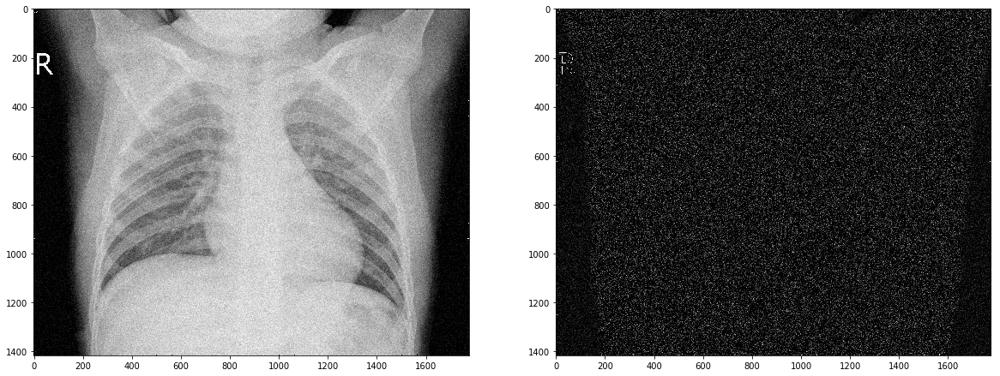

In [100]:
lap = cv2.Laplacian(noise_img,cv2.CV_8UC1,3)
plt.figure(figsize=(20,10))
plt.subplot(121),plt.imshow(noise_img,cmap='gray')
plt.subplot(122),plt.imshow(lap,cmap='gray')

(<matplotlib.axes._subplots.AxesSubplot at 0x23dd3193898>,
 <matplotlib.image.AxesImage at 0x23dd2a3d6d8>)

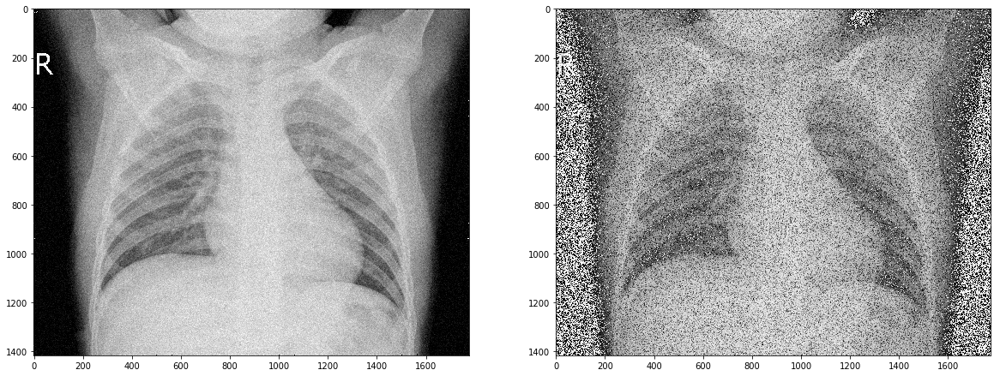

In [101]:
sharplap = noise_img-lap
plt.figure(figsize=(20,10))
plt.subplot(121),plt.imshow(noise_img,cmap='gray')
plt.subplot(122),plt.imshow(sharplap,cmap='gray')

(<matplotlib.axes._subplots.AxesSubplot at 0x23dd20de3c8>,
 <matplotlib.image.AxesImage at 0x23dd292b630>)

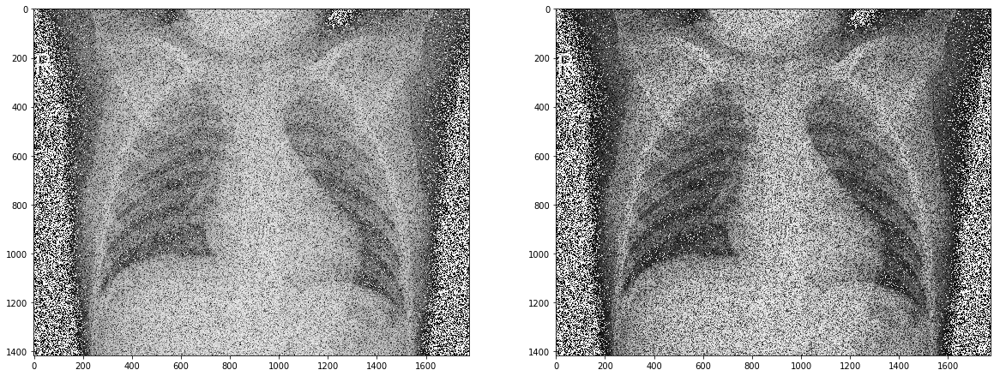

In [102]:
eq = cv2.equalizeHist(sharplap)
plt.figure(figsize=(20,10))
plt.subplot(121),plt.imshow(sharplap,cmap='gray')
plt.subplot(122),plt.imshow(eq,cmap='gray')

(<matplotlib.axes._subplots.AxesSubplot at 0x23dd32756d8>,
 <matplotlib.image.AxesImage at 0x23dd39837f0>)

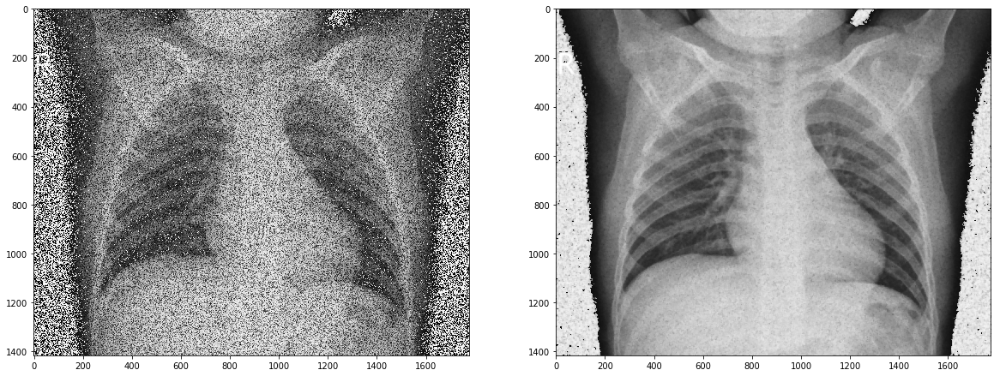

In [103]:
smooth = cv2.medianBlur(eq,9)
plt.figure(figsize=(20,10))
plt.subplot(121),plt.imshow(eq,cmap = "gray")
plt.subplot(122),plt.imshow(smooth,cmap = "gray")

(<matplotlib.axes._subplots.AxesSubplot at 0x23dd3a2e978>,
 <matplotlib.image.AxesImage at 0x23dd3361320>)

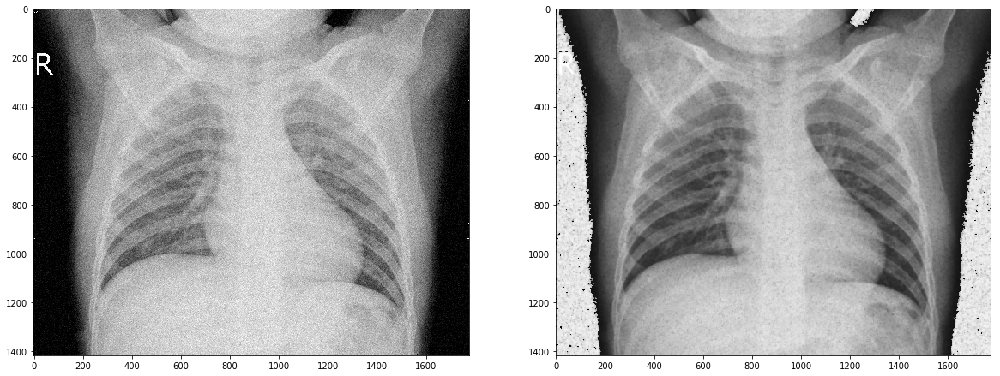

In [104]:
rows,cols = eq.shape
plaw = np.zeros((rows,cols))
for i in range(rows):
    for j in range(cols):
        plaw[i,j] = 1.7*np.power(smooth[i,j],0.95)
plt.figure(figsize=(20,10))
plt.subplot(121),plt.imshow(noise_img,cmap = "gray")
plt.subplot(122),plt.imshow(plaw,cmap = "gray")

In [132]:
img_pro = cv2.imread("chest_xray/chest_xray/final_val/NORMAL/NORMAL2-IM-1427-0001.png",cv2.IMREAD_GRAYSCALE)

In [134]:
import math
def psnr(img1, img2):
    mse = np.mean( (img1 - img2) ** 2 )
    if mse == 0:
        return 100
    PIXEL_MAX = 255.0
    return 20 * math.log10(PIXEL_MAX / math.sqrt(mse))

d=psnr(noise_img,img_pro)
print(round(d,2))

28.42


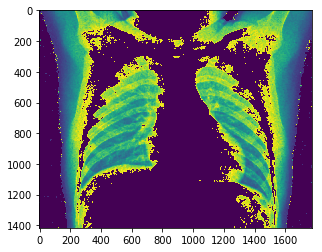

In [136]:
markers = np.zeros(img_pro.shape,dtype=np.uint)
markers[(img_pro < 200)] = img_pro[(img_pro < 200)]
markers[(img_pro > 200)] = 0
plt.imshow(markers)

(<matplotlib.axes._subplots.AxesSubplot at 0x23dd6fb4d30>,
 <matplotlib.image.AxesImage at 0x23ddce532e8>)

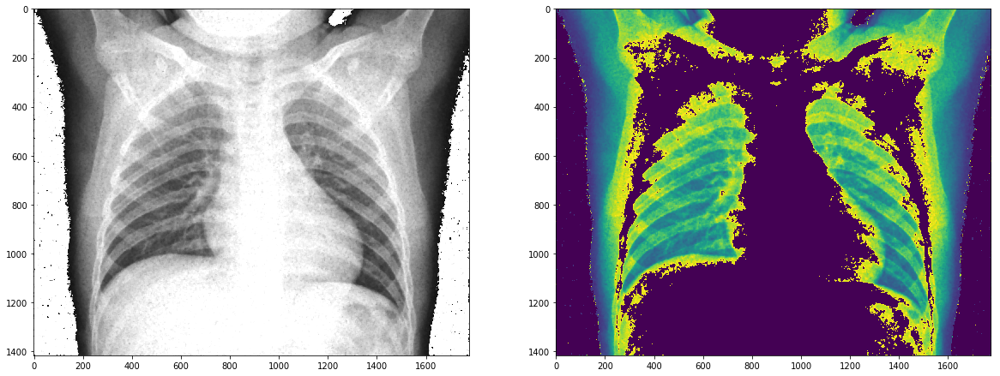

In [137]:
plt.figure(figsize=(20,10))
plt.subplot(121),plt.imshow(img_pro,cmap = "gray")
plt.subplot(122),plt.imshow(markers)

In [113]:
def noised_image_processing(folder1,folder2):
    for fname in tqdm(os.listdir(folder1)):
        fimg = cv2.imread(os.path.join(folder1,fname),cv2.IMREAD_GRAYSCALE)
        if fimg is not None:
            img = random_noise(fimg, mode='gaussian', var=0.05**2) #AddingGaussianNoise
            img = (255*img).astype(np.uint8) #NoisedImage
            lap = cv2.Laplacian(img,cv2.CV_8UC1,3)
            sharplap = (img - lap)
            eq = cv2.equalizeHist(sharplap)
            smooth = cv2.medianBlur(eq,9)
            rows,cols = smooth.shape
            powerlaw = np.zeros((rows,cols))
            for i in range(rows):
                for j in range(cols):
                    powerlaw[i,j] = 1.7*np.power(smooth[i,j],0.95)
            name = fname.split(".")[0] + ".png"
            cv2.imwrite(os.path.join(folder2,name),powerlaw)

In [36]:
image_processing(val_normal,pro_un_val_normal)

100%|██████████| 8/8 [00:50<00:00,  6.38s/it]


In [37]:
image_processing(val_pneumonia,pro_un_val_pneumonia)

100%|██████████| 8/8 [00:29<00:00,  4.38s/it]


In [38]:
val_un_normal = pd.DataFrame()
val_un_normal = seg_glcm(pro_un_val_normal,0,val_un_normal)

100%|██████████| 8/8 [00:01<00:00,  7.78it/s]


In [39]:
val_un_pneumonia = pd.DataFrame()
val_un_pneumonia = seg_glcm(pro_un_val_pneumonia,0,val_un_pneumonia)

100%|██████████| 8/8 [00:00<00:00, 20.24it/s]


In [40]:
val_un = val_un_normal.append(val_un_pneumonia)

In [41]:
X_val = val_un.drop("Class",axis=1);
y_val = val_un["Class"]

In [47]:
pred_svm_val = svm.predict(X_val)

In [49]:
print("Confusion Matrix: ")
print(confusion_matrix(y_val,pred_svm_val))
print("Accuracy: "+str(accuracy_score(y_val,pred_svm_val)))
conf = confusion_matrix(y_val,pred_svm_val)
print("Sensitivity: "+str(conf[0,0]/(conf[0,0]+conf[0,1])))
print("Specificity: "+str(conf[1,1]/(conf[1,1]+conf[1,0])))

Confusion Matrix: 
[[10  6]
 [ 0  0]]
Accuracy: 0.625
Sensitivity: 0.625


C:\Users\Tanay Shah\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in longlong_scalars
  


Specificity: nan


In [114]:
noised_image_processing(val_normal,pro_val_normal)

100%|██████████| 8/8 [00:58<00:00,  7.36s/it]


In [115]:
noised_image_processing(val_pneumonia,pro_val_pneumonia)

100%|██████████| 8/8 [00:32<00:00,  4.74s/it]


In [117]:
val_normal = pd.DataFrame()
val_normal = seg_glcm(pro_val_normal,0,val_normal)

100%|██████████| 8/8 [00:01<00:00,  6.89it/s]


In [118]:
val_pneumonia = pd.DataFrame()
val_pneumonia = seg_glcm(pro_val_pneumonia,1,val_pneumonia)

100%|██████████| 8/8 [00:00<00:00, 13.94it/s]


In [119]:
val_noise = val_normal.append(val_pneumonia)

In [120]:
val_noise.to_csv("noisy_val.csv",index=None)

In [122]:
X_val = val_noise.drop("Class",axis=1);
y_val = val_noise["Class"]

In [125]:
pred_svm_val = svm.predict(X_val)

In [127]:
print("Confusion Matrix: ")
print(confusion_matrix(y_val,pred_svm_val))
print("Accuracy: "+str(accuracy_score(y_val,pred_svm_val)))
conf = confusion_matrix(y_val,pred_svm_val)
print("Sensitivity: "+str(conf[0,0]/(conf[0,0]+conf[1,0])))
print("Specificity: "+str(conf[1,1]/(conf[1,0]+conf[1,1])))

Confusion Matrix: 
[[8 0]
 [4 4]]
Accuracy: 0.75
Sensitivity: 0.6666666666666666
Specificity: 1.0


In [128]:
fpr_val_svm,tpr_val_svm,_ = roc_curve(y_val,pred_svm_val)
auc_val_svm = roc_auc_score(y_val,pred_svm_val)

Area under curve: 0.75


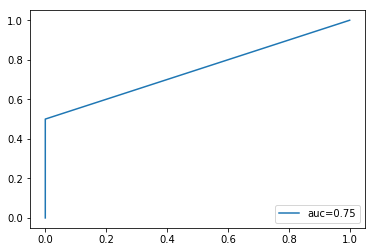

In [129]:
print("Area under curve: "+str(round(auc_val_svm,3)))
plt.plot(fpr_val_svm,tpr_val_svm,label="auc="+str(round(auc_val_svm,3)))
plt.legend(loc=4)
plt.show()

Hence our process classifies 12/16 noisy images (Gaussian Noise) correctly

# Experimenting by changing the ratio of Training and Testing Set

In [5]:
from sklearn.model_selection import train_test_split

In [6]:
train = pd.read_csv("train_glcm.csv")
test = pd.read_csv("test_glcm.csv")

In [7]:
final = train.append(test)

In [8]:
X_train,X_test,y_train,y_test = train_test_split(final.drop("Class",axis=1),final["Class"],test_size = 0.2,random_state=42)

In [12]:
svm_8515 = SVC(kernel='poly')
svm_8020 = SVC(kernel='poly')
svm_7525 = SVC(kernel='poly')
svm_7030 = SVC(kernel='poly')
svm_6535 = SVC(kernel='poly')

C:\Users\Tanay Shah\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


Confusion Matrix: 
[[204  39]
 [102 531]]
Accuracy: 0.839041095890411
Sensitivity: 0.6666666666666666
Specificity: 0.9315789473684211
Area under curve: 0.839


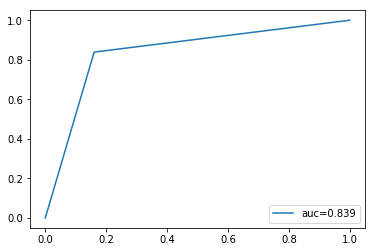

In [10]:
X_train,X_test,y_train,y_test = train_test_split(final.drop("Class",axis=1),final["Class"],test_size = 0.15,random_state=42)
svm_8515.fit(X_train,y_train)
pred_8515 = svm_8515.predict(X_test)
print("Confusion Matrix: ")
print(confusion_matrix(y_test,pred_8515))
print("Accuracy: "+str(accuracy_score(y_test,pred_8515)))
conf = confusion_matrix(y_test,pred_8515)
print("Sensitivity: "+str(conf[0,0]/(conf[0,0]+conf[1,0])))
print("Specificity: "+str(conf[1,1]/(conf[0,1]+conf[1,1])))
fpr_8515,tpr_8515,_ = roc_curve(y_test,pred_8515)
auc_8515 = roc_auc_score(y_test,pred_8515)
print("Area under curve: "+str(round(auc_8515,3)))
plt.plot(fpr_8515,tpr_8515,label="auc="+str(round(auc_8515,3)))
plt.legend(loc=4)
plt.show()

In [145]:
svm_8020.fit(X_train,y_train)

C:\Users\Tanay Shah\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='poly', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False)

In [146]:
pred_8020 = svm_8020.predict(X_test)

In [147]:
print("Confusion Matrix: ")
print(confusion_matrix(y_test,pred_8020))
print("Accuracy: "+str(accuracy_score(y_test,pred_8020)))
conf = confusion_matrix(y_test,pred_8020)
print("Sensitivity: "+str(conf[0,0]/(conf[0,0]+conf[1,0])))
print("Specificity: "+str(conf[1,1]/(conf[0,1]+conf[1,1])))

Confusion Matrix: 
[[277  49]
 [124 718]]
Accuracy: 0.8518835616438356
Sensitivity: 0.6907730673316709
Specificity: 0.9361147327249022


In [148]:
fpr_8020,tpr_8020,_ = roc_curve(y_test,pred_8020)
auc_8020 = roc_auc_score(y_test,pred_8020)

Area under curve: 0.851


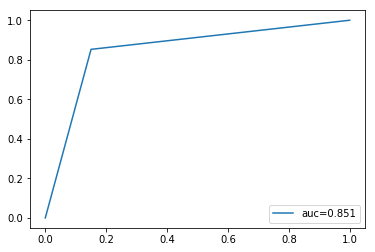

In [149]:
print("Area under curve: "+str(round(auc_8020,3)))
plt.plot(fpr_8020,tpr_8020,label="auc="+str(round(auc_8020,3)))
plt.legend(loc=4)
plt.show()

C:\Users\Tanay Shah\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


Confusion Matrix: 
[[346  56]
 [161 897]]
Accuracy: 0.8513698630136987
Sensitivity: 0.6824457593688363
Specificity: 0.9412381951731374
Area under curve: 0.854


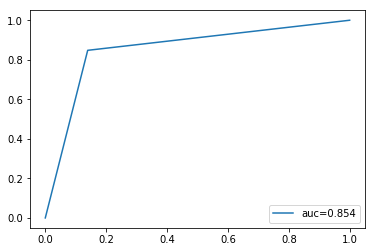

In [150]:
X_train,X_test,y_train,y_test = train_test_split(final.drop("Class",axis=1),final["Class"],test_size = 0.25,random_state=42)
svm_7525.fit(X_train,y_train)
pred_7525 = svm_7525.predict(X_test)
print("Confusion Matrix: ")
print(confusion_matrix(y_test,pred_7525))
print("Accuracy: "+str(accuracy_score(y_test,pred_7525)))
conf = confusion_matrix(y_test,pred_7525)
print("Sensitivity: "+str(conf[0,0]/(conf[0,0]+conf[1,0])))
print("Specificity: "+str(conf[1,1]/(conf[0,1]+conf[1,1])))
fpr_7525,tpr_7525,_ = roc_curve(y_test,pred_7525)
auc_7525 = roc_auc_score(y_test,pred_7525)
print("Area under curve: "+str(round(auc_7525,3)))
plt.plot(fpr_7525,tpr_7525,label="auc="+str(round(auc_7525,3)))
plt.legend(loc=4)
plt.show()

C:\Users\Tanay Shah\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


Confusion Matrix: 
[[ 419   70]
 [ 192 1071]]
Accuracy: 0.8504566210045662
Sensitivity: 0.6857610474631751
Specificity: 0.9386503067484663
Area under curve: 0.852


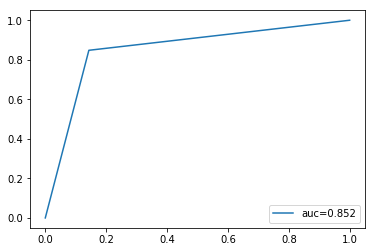

In [151]:
X_train,X_test,y_train,y_test = train_test_split(final.drop("Class",axis=1),final["Class"],test_size = 0.3,random_state=42)
svm_7030.fit(X_train,y_train)
pred_7030 = svm_7030.predict(X_test)
print("Confusion Matrix: ")
print(confusion_matrix(y_test,pred_7030))
print("Accuracy: "+str(accuracy_score(y_test,pred_7030)))
conf = confusion_matrix(y_test,pred_7030)
print("Sensitivity: "+str(conf[0,0]/(conf[0,0]+conf[1,0])))
print("Specificity: "+str(conf[1,1]/(conf[0,1]+conf[1,1])))
fpr_7030,tpr_7030,_ = roc_curve(y_test,pred_7030)
auc_7030 = roc_auc_score(y_test,pred_7030)
print("Area under curve: "+str(round(auc_7030,3)))
plt.plot(fpr_7030,tpr_7030,label="auc="+str(round(auc_7030,3)))
plt.legend(loc=4)
plt.show()

C:\Users\Tanay Shah\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


Confusion Matrix: 
[[ 499   82]
 [ 233 1230]]
Accuracy: 0.8458904109589042
Sensitivity: 0.6816939890710383
Specificity: 0.9375
Area under curve: 0.85


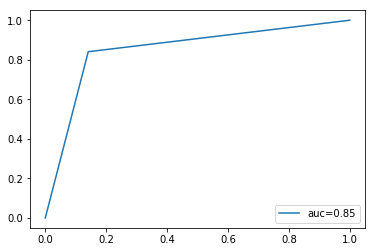

In [13]:
X_train,X_test,y_train,y_test = train_test_split(final.drop("Class",axis=1),final["Class"],test_size = 0.35,random_state=42)
svm_6535.fit(X_train,y_train)
pred_6535 = svm_6535.predict(X_test)
print("Confusion Matrix: ")
print(confusion_matrix(y_test,pred_6535))
print("Accuracy: "+str(accuracy_score(y_test,pred_6535)))
conf = confusion_matrix(y_test,pred_6535)
print("Sensitivity: "+str(conf[0,0]/(conf[0,0]+conf[1,0])))
print("Specificity: "+str(conf[1,1]/(conf[0,1]+conf[1,1])))
fpr_6535,tpr_6535,_ = roc_curve(y_test,pred_6535)
auc_6535 = roc_auc_score(y_test,pred_6535)
print("Area under curve: "+str(round(auc_6535,3)))
plt.plot(fpr_6535,tpr_6535,label="auc="+str(round(auc_6535,3)))
plt.legend(loc=4)
plt.show()